In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import cv2
from skimage import io

from skimage.morphology import remove_small_objects

from scipy.spatial.distance import cdist
import scipy.stats as st

import networkx as nx

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
# upload image
img_orig_red_green_blue = np.int16(io.imread('/content/drive/MyDrive/Intro to CV/HW1/red_green_blue.jpg'))
img_cv_red_green_blue = cv2.imread('/content/drive/MyDrive/Intro to CV/HW1/red_green_blue.jpg')

img_orig_black_red_yellow = np.int16(io.imread('/content/drive/MyDrive/Intro to CV/HW1/black_red_yellow.jpg'))
img_cv_black_red_yellow = cv2.imread('/content/drive/MyDrive/Intro to CV/HW1/black_red_yellow.jpg')


# images in different color schemes
img_lab_red_green_blue = cv2.cvtColor(img_cv_red_green_blue, cv2.COLOR_BGR2Lab)
img_ycrcb_red_green_blue = cv2.cvtColor(img_cv_red_green_blue, cv2.COLOR_BGR2YCrCb)
img_hsv_red_green_blue = cv2.cvtColor(img_cv_red_green_blue, cv2.COLOR_BGR2HSV)
img_rgb_red_green_blue = cv2.cvtColor(img_cv_red_green_blue, cv2.COLOR_BGR2RGB)

img_lab_black_red_yellow = cv2.cvtColor(img_cv_black_red_yellow, cv2.COLOR_BGR2Lab)
img_ycrcb_black_red_yellow = cv2.cvtColor(img_cv_black_red_yellow, cv2.COLOR_BGR2YCrCb)
img_hsv_black_red_yellow = cv2.cvtColor(img_cv_black_red_yellow, cv2.COLOR_BGR2HSV)
img_rgb_black_red_yellow = cv2.cvtColor(img_cv_black_red_yellow, cv2.COLOR_BGR2RGB)

## Color schemes preparation

LAB color scheme

In [4]:
L_red_green_blue = img_lab_red_green_blue[:,:,0]
A_red_green_blue = img_lab_red_green_blue[:,:,1]
B_red_green_blue = img_lab_red_green_blue[:,:,2]

L_black_red_yellow = img_lab_black_red_yellow[:,:,0]
A_black_red_yellow = img_lab_black_red_yellow[:,:,1]
B_black_red_yellow = img_lab_black_red_yellow[:,:,2]


Y-Cr-Cb color scheme

In [5]:
Y_red_green_blue = img_ycrcb_red_green_blue[:,:,0]
Cr_red_green_blue = img_ycrcb_red_green_blue[:,:,1]
Cb_red_green_blue = img_ycrcb_red_green_blue[:,:,2]

Y_black_red_yellow = img_ycrcb_black_red_yellow[:,:,0]
Cr_black_red_yellow = img_ycrcb_black_red_yellow[:,:,1]
Cb_black_red_yellow = img_ycrcb_black_red_yellow[:,:,2]


HSV color scheme

In [6]:
H_red_green_blue = img_hsv_red_green_blue[:,:,0]
S_red_green_blue = img_hsv_red_green_blue[:,:,1]
V_red_green_blue = img_hsv_red_green_blue[:,:,2]

H_black_red_yellow = img_hsv_black_red_yellow[:,:,0]
S_black_red_yellow = img_hsv_black_red_yellow[:,:,1]
V_black_red_yellow = img_hsv_black_red_yellow[:,:,2]


RGB color scheme

In [7]:
Red_red_green_blue = img_rgb_red_green_blue[:,:,0]
Green_red_green_blue = img_rgb_red_green_blue[:,:,1]
Blue_red_green_blue = img_rgb_red_green_blue[:,:,2]

Red_black_red_yellow = img_rgb_black_red_yellow[:,:,0]
Green_black_red_yellow = img_rgb_black_red_yellow[:,:,1]
Blue_black_red_yellow = img_rgb_black_red_yellow[:,:,2]


## Different colors search and defining amount of trains for each color

RED COLOR SEARCH

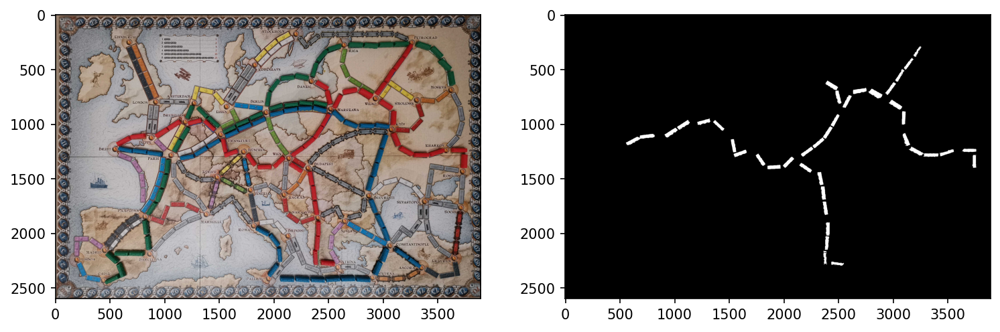

In [8]:
# RED - DEFINED !

mask = (Cr_red_green_blue > 190) & (Cr_red_green_blue < 208)
img2 = img_orig_red_green_blue.copy()

mask = remove_small_objects(mask, min_size = 700)

mask_int = mask.astype(np.uint8)
kernel = np.ones((5,5))
mask_int = cv2.morphologyEx(mask_int, cv2.MORPH_CLOSE, kernel)
kernel = np.ones((5,5))
mask_int = cv2.morphologyEx(mask_int, cv2.MORPH_OPEN, kernel)

plt.figure(dpi=150, figsize=(12, 6))
plt.subplot(1,2,1)   
plt.imshow(img2)
plt.subplot(1,2,2)     
plt.imshow(mask, cmap='gray')

Number of countours here:  39


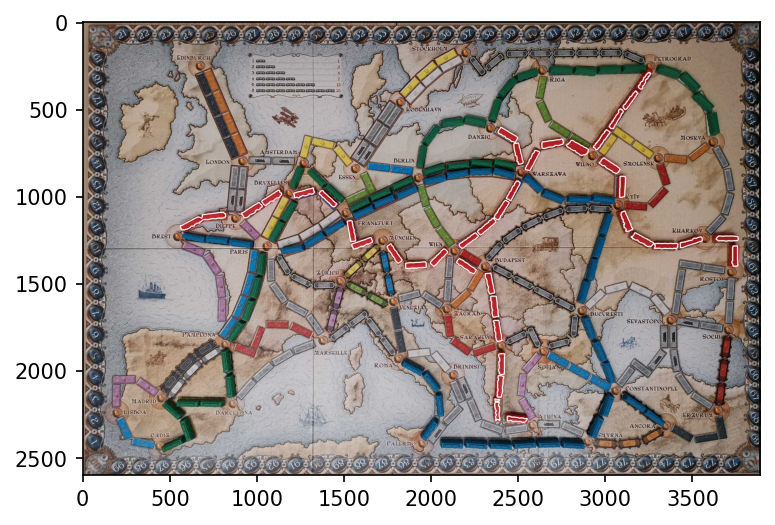

In [9]:
contours, hierarchy = cv2.findContours(mask_int, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

img_cnt = img_orig_red_green_blue.copy()
cv2.drawContours(img_cnt, contours, -1, (255,255,255), 5)
plt.figure(dpi=150)
plt.imshow(img_cnt)

print("Number of countours here: ", str(len(contours)))

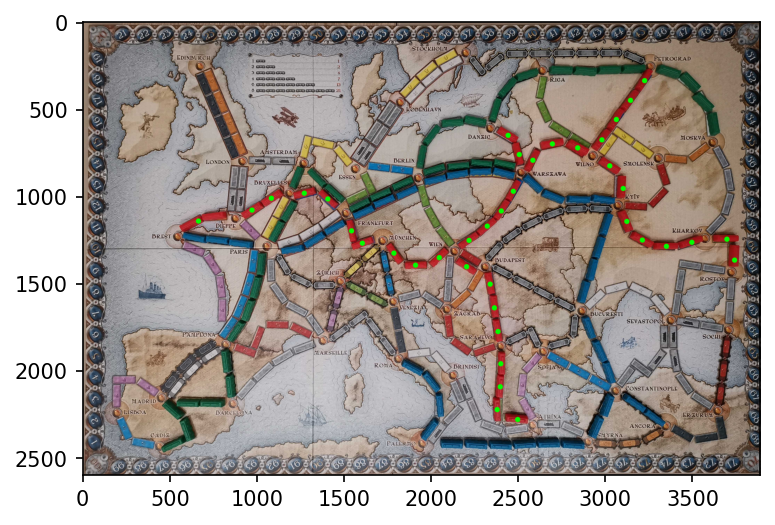

In [10]:
# centers of mass

img_mass = img_orig_red_green_blue.copy()

train_mass = np.zeros([len(contours), 2])

for i in range(len(contours)):
  
  kpCnt = len(contours[i])
  x = 0
  y = 0

  for kp in contours[i]:
    x = x+kp[0][0]
    y = y+kp[0][1]

  train_mass[i][0] = np.uint32(np.ceil(x/kpCnt))
  train_mass[i][1] = np.uint32(np.ceil(y/kpCnt))

  cv2.circle(img_mass, (np.uint32(np.ceil(x/kpCnt)), np.uint32(np.ceil(y/kpCnt))), 5, (0, 255, 0), 20)

plt.figure(dpi = 150)
plt.imshow(img_mass)

In [11]:
# Adjacency matrix creation with SciPy

distance = cdist(train_mass, train_mass, metric='euclidean')

# substitute high value (10 000) instead of zeros in matrix 'distance'
distance_modified = np.copy(distance)
distance_modified[distance == 0] = 10000.0

# finding minimums and threshold
mins_dist = np.min(distance_modified, axis=1)
threshold_dist = 1.25 * np.mean(mins_dist)

# getting adj matrix (final version with zeros)
distances_adj = np.copy(distance_modified)
distances_adj[distance_modified >= threshold_dist] = 0

# trial version with 1 instead of distances
distances_adj_ones = np.copy(distances_adj)
distances_adj_ones[distances_adj != 0] = 1

# filtering
for i in range(distance_modified.shape[1]):
  #print(i)

  if i == 0:
    distances_adj = np.copy(distance_modified)
    distances_adj[distance_modified >= threshold_dist] = 0

    distances_adj_ones = np.copy(distances_adj)
    distances_adj_ones[distances_adj != 0] = 1

  while np.sum(distances_adj_ones, axis = 1)[i] > 2:
    temp_column_max = np.max(distances_adj[:,i])
    
    #print("max is ", temp_column_max)
    
    distance_modified[distance_modified == temp_column_max] = 0

    distances_adj = np.copy(distance_modified)
    distances_adj[distance_modified >= threshold_dist] = 0

    distances_adj_ones = np.copy(distances_adj)
    distances_adj_ones[distances_adj != 0] = 1

#np.sum(distances_adj_ones, axis = 1)

G=nx.Graph(distances_adj_ones)
graph_chains = sorted(nx.connected_components(G), key = len, reverse=True)

score = 0

for chain in graph_chains:
  print(chain)
  print("chain length = ", len(chain))

  # score calculation

  if len(chain) == 1:
    score += 1
  elif len(chain) == 2:
    score += 2
  elif len(chain) == 3:
    score += 4
  elif len(chain) == 4:
    score += 7
  elif len(chain) == 5: # calculate like 2 and 3 trains
    score += 2
    score += 3
  elif len(chain) == 6:
    score += 15
  elif len(chain) == 7: # calculate like 4 and 3 trains
    score += 7
    score += 3
  elif len(chain) == 8:
    score += 21
  elif len(chain) == 9: #calculate like 1 and 8 trains
    score += 21
    score += 1
  elif len(chain) == 10: #calculate like 4 and 6 trains
    score += 7
    score += 15
  elif len(chain) == 11: #calculate like 4, 4 and 3 trains
    score += 7
    score += 7
    score += 4
  elif len(chain) == 12: #calculate like 6, 3 and 3 trains
    score += 15
    score += 4
    score += 4
  
  print("Your score becomes ", score)

print("Final score for this color is ", score)


{32, 33, 34, 35, 36, 37, 38, 30, 31}
chain length =  9
Your score becomes  22
{7, 8, 9, 11, 17, 19, 23, 27}
chain length =  8
Your score becomes  43
{0, 1, 2, 3}
chain length =  4
Your score becomes  50
{16, 12, 21, 14}
chain length =  4
Your score becomes  57
{4, 5, 6}
chain length =  3
Your score becomes  61
{10, 15}
chain length =  2
Your score becomes  63
{18, 13}
chain length =  2
Your score becomes  65
{25, 22}
chain length =  2
Your score becomes  67
{24, 26}
chain length =  2
Your score becomes  69
{28, 29}
chain length =  2
Your score becomes  71
{20}
chain length =  1
Your score becomes  72
Final score for this color is  72


GREEN COLOR SEARCH

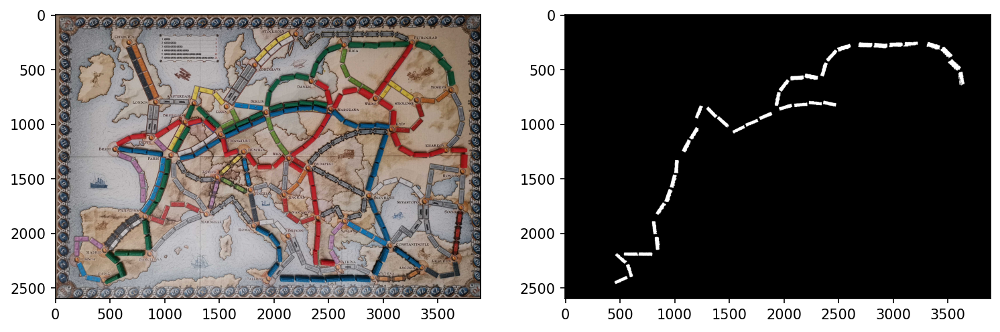

In [12]:
# GREEN - DEFINED !

mask = (A_red_green_blue < 108) & (A_red_green_blue > 85) & (B_red_green_blue > 60) & (B_red_green_blue < 145)
img2 = img_orig_red_green_blue.copy()

mask = remove_small_objects(mask, min_size = 700)

mask_int = mask.astype(np.uint8)
kernel = np.ones((5,5))
mask_int = cv2.morphologyEx(mask_int, cv2.MORPH_CLOSE, kernel)
kernel = np.ones((5,5))
mask_int = cv2.morphologyEx(mask_int, cv2.MORPH_OPEN, kernel)

plt.figure(dpi=150, figsize=(12, 6))
plt.subplot(1,2,1)   
plt.imshow(img2)
plt.subplot(1,2,2)     
plt.imshow(mask, cmap='gray')

Number of countours here:  37


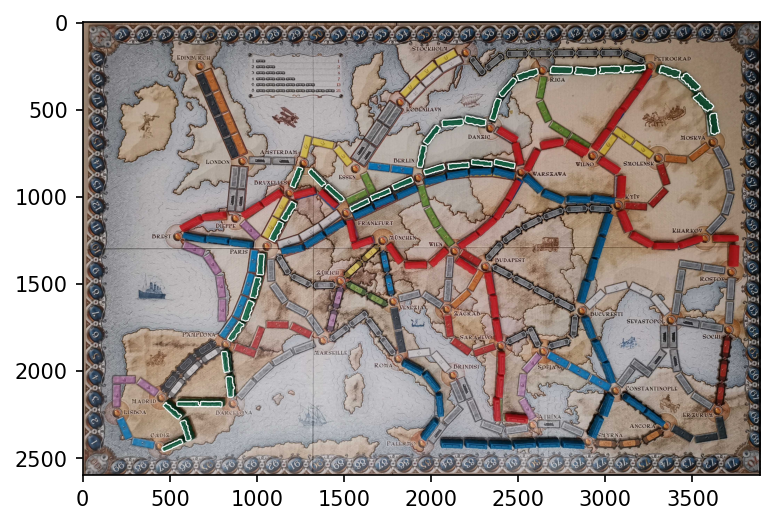

In [13]:
contours, hierarchy = cv2.findContours(mask_int, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

img_cnt = img_orig_red_green_blue.copy()
cv2.drawContours(img_cnt, contours, -1, (255,255,255), 5)
plt.figure(dpi=150)
plt.imshow(img_cnt)

print("Number of countours here: ", str(len(contours)))

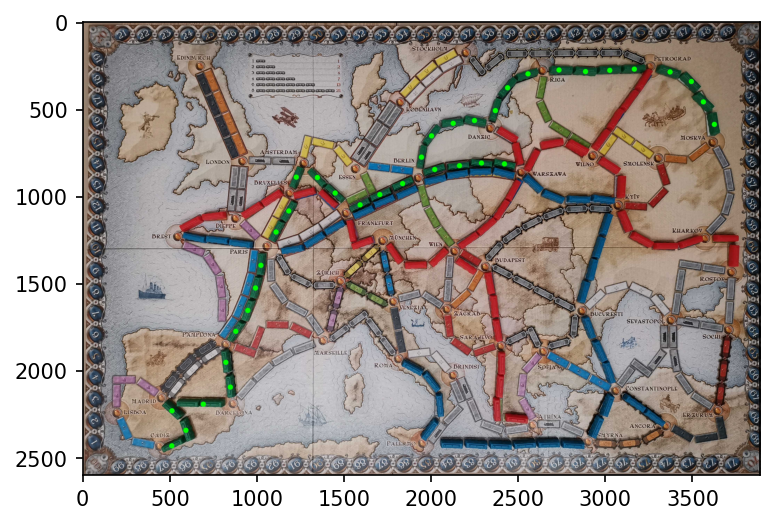

In [14]:
# centers of mass

img_mass = img_orig_red_green_blue.copy()

train_mass = np.zeros([len(contours), 2])

for i in range(len(contours)):
  
  kpCnt = len(contours[i])
  x = 0
  y = 0

  for kp in contours[i]:
    x = x+kp[0][0]
    y = y+kp[0][1]

  train_mass[i][0] = np.uint32(np.ceil(x/kpCnt))
  train_mass[i][1] = np.uint32(np.ceil(y/kpCnt))

  cv2.circle(img_mass, (np.uint32(np.ceil(x/kpCnt)), np.uint32(np.ceil(y/kpCnt))), 5, (0, 255, 0), 20)

plt.figure(dpi = 150)
plt.imshow(img_mass)

In [15]:
# Adjacency matrix creation with SciPy

distance = cdist(train_mass, train_mass, metric='euclidean')

# substitute high value (10 000) instead of zeros in matrix 'distance'
distance_modified = np.copy(distance)
distance_modified[distance == 0] = 10000.0

# finding minimums and threshold
mins_dist = np.min(distance_modified, axis=1)
threshold_dist = 1.25 * np.mean(mins_dist)

# getting adj matrix (final version with zeros)
distances_adj = np.copy(distance_modified)
distances_adj[distance_modified >= threshold_dist] = 0

# trial version with 1 instead of distances
distances_adj_ones = np.copy(distances_adj)
distances_adj_ones[distances_adj != 0] = 1

# filtering
for i in range(distance_modified.shape[1]):
  #print(i)

  if i == 0:
    distances_adj = np.copy(distance_modified)
    distances_adj[distance_modified >= threshold_dist] = 0

    distances_adj_ones = np.copy(distances_adj)
    distances_adj_ones[distances_adj != 0] = 1

  while np.sum(distances_adj_ones, axis = 1)[i] > 2:
    temp_column_max = np.max(distances_adj[:,i])
    
    #print("max is ", temp_column_max)
    
    distance_modified[distance_modified == temp_column_max] = 0

    distances_adj = np.copy(distance_modified)
    distances_adj[distance_modified >= threshold_dist] = 0

    distances_adj_ones = np.copy(distances_adj)
    distances_adj_ones[distances_adj != 0] = 1

#np.sum(distances_adj_ones, axis = 1)

G=nx.Graph(distances_adj_ones)
graph_chains = sorted(nx.connected_components(G), key = len, reverse=True)

score = 0

for chain in graph_chains:
  print(chain)
  print("chain length = ", len(chain))

  # score calculation

  if len(chain) == 1:
    score += 1
  elif len(chain) == 2:
    score += 2
  elif len(chain) == 3:
    score += 4
  elif len(chain) == 4:
    score += 7
  elif len(chain) == 5: # calculate like 2 and 3 trains
    score += 2
    score += 3
  elif len(chain) == 6:
    score += 15
  elif len(chain) == 7: # calculate like 4 and 3 trains
    score += 7
    score += 3
  elif len(chain) == 8:
    score += 21
  elif len(chain) == 9: #calculate like 1 and 8 trains
    score += 21
    score += 1
  elif len(chain) == 10: #calculate like 4 and 6 trains
    score += 7
    score += 15
  elif len(chain) == 11: #calculate like 4, 4 and 3 trains
    score += 7
    score += 7
    score += 4
  elif len(chain) == 12: #calculate like 6, 3 and 3 trains
    score += 15
    score += 4
    score += 4
  
  print("Your score becomes ", score)

print("Final score for this color is ", score)


{18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 31}
chain length =  11
Your score becomes  18
{12, 13, 14, 15, 16, 17}
chain length =  6
Your score becomes  33
{8, 9, 6, 7}
chain length =  4
Your score becomes  40
{26, 35, 28, 30}
chain length =  4
Your score becomes  47
{32, 33, 34, 36}
chain length =  4
Your score becomes  54
{0, 1, 2}
chain length =  3
Your score becomes  58
{4, 5}
chain length =  2
Your score becomes  60
{10, 11}
chain length =  2
Your score becomes  62
{3}
chain length =  1
Your score becomes  63
Final score for this color is  63


BLUE COLOR SEARCH

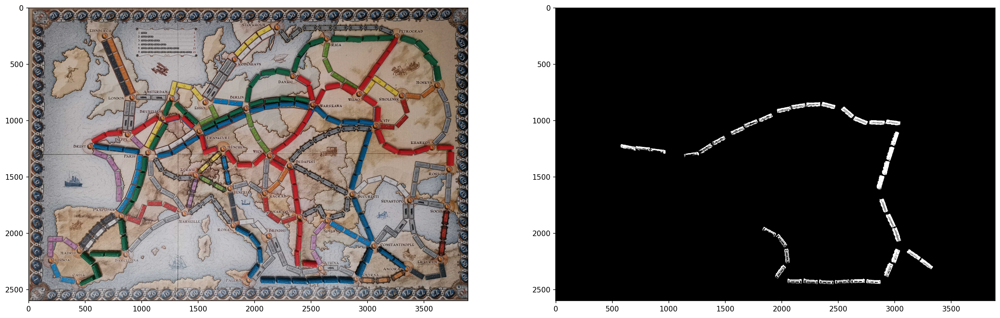

In [16]:
# BLUE - DEFINED (masks 10,10 / 5,5)

mask = (Y_red_green_blue > 22) & (Y_red_green_blue < 80) & (Cr_red_green_blue > 82) & (Cr_red_green_blue < 110) & (Cb_red_green_blue > 140) & (Cb_red_green_blue < 168)
img2 = img_orig_red_green_blue.copy()

mask = remove_small_objects(mask, min_size = 700)

mask_int = mask.astype(np.uint8)
kernel = np.ones((10,10))
mask_int = cv2.morphologyEx(mask_int, cv2.MORPH_CLOSE, kernel)
kernel = np.ones((5,5))
mask_int = cv2.morphologyEx(mask_int, cv2.MORPH_OPEN, kernel)

plt.figure(dpi=150, figsize=(24, 12))
plt.subplot(1,2,1)   
plt.imshow(img2)
plt.subplot(1,2,2)     
plt.imshow(mask, cmap='gray')

Number of countours here:  28


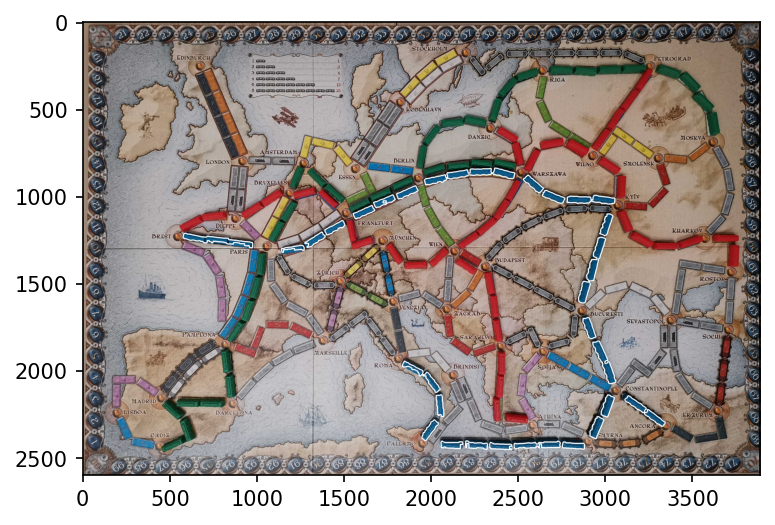

In [17]:
contours, hierarchy = cv2.findContours(mask_int, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

img_cnt = img_orig_red_green_blue.copy()
cv2.drawContours(img_cnt, contours, -1, (255,255,255), 5)
plt.figure(dpi=150)
plt.imshow(img_cnt)

print("Number of countours here: ", str(len(contours)))

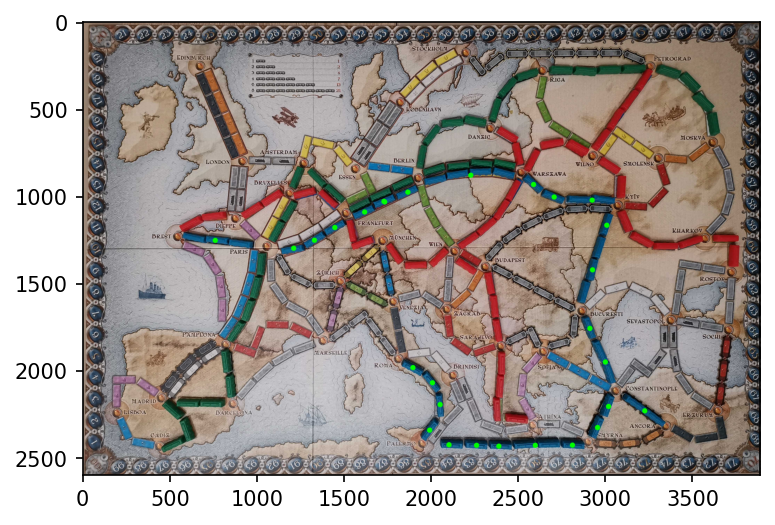

In [18]:
# centers of mass

img_mass = img_orig_red_green_blue.copy()

train_mass = np.zeros([len(contours), 2])

for i in range(len(contours)):
  
  kpCnt = len(contours[i])
  x = 0
  y = 0

  for kp in contours[i]:
    x = x+kp[0][0]
    y = y+kp[0][1]

  train_mass[i][0] = np.uint32(np.ceil(x/kpCnt))
  train_mass[i][1] = np.uint32(np.ceil(y/kpCnt))

  cv2.circle(img_mass, (np.uint32(np.ceil(x/kpCnt)), np.uint32(np.ceil(y/kpCnt))), 5, (0, 255, 0), 20)

plt.figure(dpi = 150)
plt.imshow(img_mass)

In [19]:
# Adjacency matrix creation with SciPy

distance = cdist(train_mass, train_mass, metric='euclidean')

# substitute high value (10 000) instead of zeros in matrix 'distance'
distance_modified = np.copy(distance)
distance_modified[distance == 0] = 10000.0

# finding minimums and threshold
mins_dist = np.min(distance_modified, axis=1)
threshold_dist = 1.25 * np.mean(mins_dist)

# getting adj matrix (final version with zeros)
distances_adj = np.copy(distance_modified)
distances_adj[distance_modified >= threshold_dist] = 0

# trial version with 1 instead of distances
distances_adj_ones = np.copy(distances_adj)
distances_adj_ones[distances_adj != 0] = 1

# filtering
for i in range(distance_modified.shape[1]):
  #print(i)

  if i == 0:
    distances_adj = np.copy(distance_modified)
    distances_adj[distance_modified >= threshold_dist] = 0

    distances_adj_ones = np.copy(distances_adj)
    distances_adj_ones[distances_adj != 0] = 1

  while np.sum(distances_adj_ones, axis = 1)[i] > 2:
    temp_column_max = np.max(distances_adj[:,i])
    
    #print("max is ", temp_column_max)
    
    distance_modified[distance_modified == temp_column_max] = 0

    distances_adj = np.copy(distance_modified)
    distances_adj[distance_modified >= threshold_dist] = 0

    distances_adj_ones = np.copy(distances_adj)
    distances_adj_ones[distances_adj != 0] = 1

#np.sum(distances_adj_ones, axis = 1)

G=nx.Graph(distances_adj_ones)
graph_chains = sorted(nx.connected_components(G), key = len, reverse=True)

score = 0

for chain in graph_chains:
  print(chain)
  print("chain length = ", len(chain))

  # score calculation

  if len(chain) == 1:
    score += 1
  elif len(chain) == 2:
    score += 2
  elif len(chain) == 3:
    score += 4
  elif len(chain) == 4:
    score += 7
  elif len(chain) == 5: # calculate like 2 and 3 trains
    score += 2
    score += 3
  elif len(chain) == 6:
    score += 15
  elif len(chain) == 7: # calculate like 4 and 3 trains
    score += 7
    score += 3
  elif len(chain) == 8:
    score += 21
  elif len(chain) == 9: #calculate like 1 and 8 trains
    score += 21
    score += 1
  elif len(chain) == 10: #calculate like 4 and 6 trains
    score += 7
    score += 15
  elif len(chain) == 11: #calculate like 4, 4 and 3 trains
    score += 7
    score += 7
    score += 4
  elif len(chain) == 12: #calculate like 6, 3 and 3 trains
    score += 15
    score += 4
    score += 4
  
  print("Your score becomes ", score)

print("Final score for this color is ", score)


{0, 3, 4, 5, 9, 10, 11}
chain length =  7
Your score becomes  10
{8, 1, 6}
chain length =  3
Your score becomes  14
{17, 18, 14}
chain length =  3
Your score becomes  18
{20, 22, 23}
chain length =  3
Your score becomes  22
{19, 21}
chain length =  2
Your score becomes  24
{24, 26}
chain length =  2
Your score becomes  26
{2}
chain length =  1
Your score becomes  27
{7}
chain length =  1
Your score becomes  28
{12}
chain length =  1
Your score becomes  29
{13}
chain length =  1
Your score becomes  30
{15}
chain length =  1
Your score becomes  31
{16}
chain length =  1
Your score becomes  32
{25}
chain length =  1
Your score becomes  33
{27}
chain length =  1
Your score becomes  34
Final score for this color is  34


BLACK COLOR SEARCH

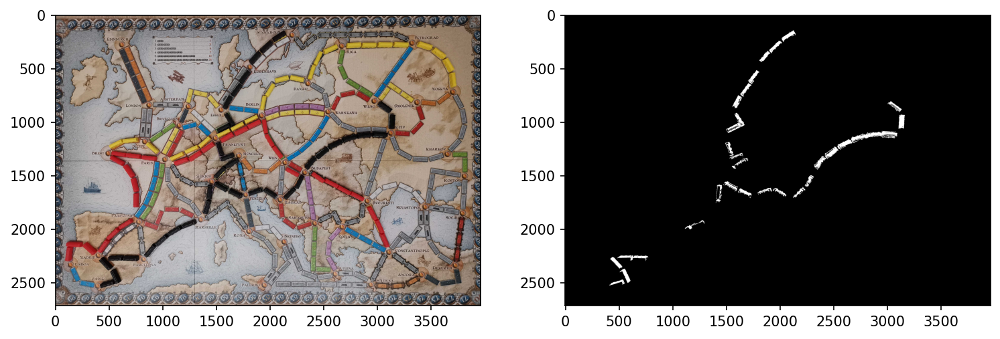

In [20]:
# BLACK

mask = (L_black_red_yellow > 0) & (L_black_red_yellow < 30) & (V_black_red_yellow > 0) & (V_black_red_yellow < 25) & (Y_black_red_yellow > 0) & (Y_black_red_yellow < 40)
img2 = img_orig_black_red_yellow.copy()

mask = remove_small_objects(mask, min_size = 1500)

mask_int = mask.astype(np.uint8)
kernel = np.ones((10,10))
mask_int = cv2.morphologyEx(mask_int, cv2.MORPH_CLOSE, kernel)
kernel = np.ones((5,5))
mask_int = cv2.morphologyEx(mask_int, cv2.MORPH_OPEN, kernel)

plt.figure(dpi=150, figsize=(12, 6))
plt.subplot(1,2,1)   
plt.imshow(img2)
plt.subplot(1,2,2)     
plt.imshow(mask, cmap='gray')

Number of countours here:  23


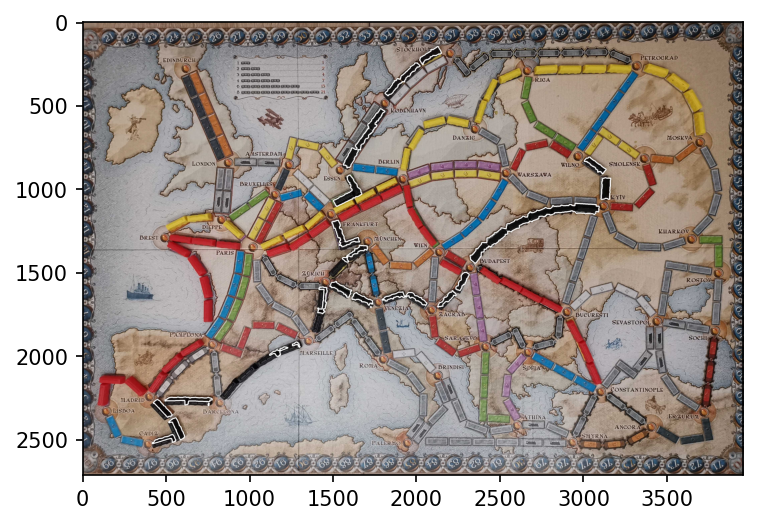

In [21]:
contours, hierarchy = cv2.findContours(mask_int, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

img_cnt = img_orig_black_red_yellow.copy()
cv2.drawContours(img_cnt, contours, -1, (255,255,255), 5)
plt.figure(dpi=150)
plt.imshow(img_cnt)

print("Number of countours here: ", str(len(contours)))

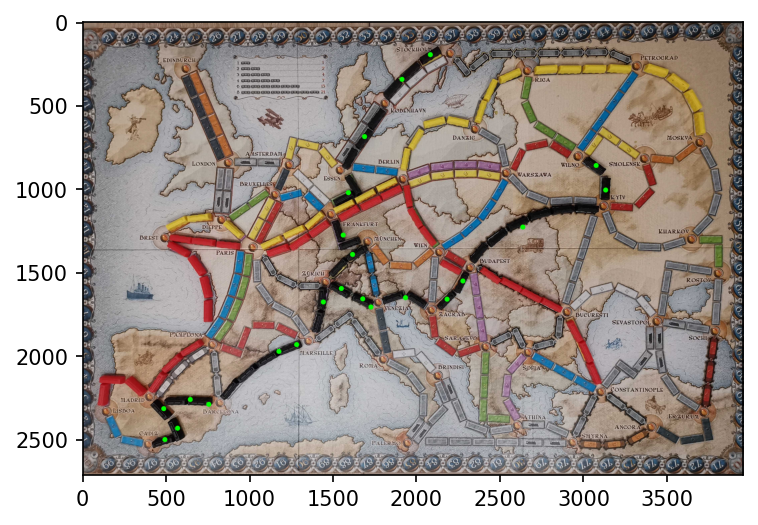

In [22]:
# centers of mass

img_mass = img_orig_black_red_yellow.copy()

train_mass = np.zeros([len(contours), 2])

for i in range(len(contours)):
  
  kpCnt = len(contours[i])
  x = 0
  y = 0

  for kp in contours[i]:
    x = x+kp[0][0]
    y = y+kp[0][1]

  train_mass[i][0] = np.uint32(np.ceil(x/kpCnt))
  train_mass[i][1] = np.uint32(np.ceil(y/kpCnt))

  cv2.circle(img_mass, (np.uint32(np.ceil(x/kpCnt)), np.uint32(np.ceil(y/kpCnt))), 5, (0, 255, 0), 20)

plt.figure(dpi = 150)
plt.imshow(img_mass)

In [23]:
# Adjacency matrix creation with SciPy

distance = cdist(train_mass, train_mass, metric='euclidean')

# substitute high value (10 000) instead of zeros in matrix 'distance'
distance_modified = np.copy(distance)
distance_modified[distance == 0] = 10000.0

# finding minimums and threshold
mins_dist = np.min(distance_modified, axis=1)
threshold_dist = 1.25 * np.mean(mins_dist)

# getting adj matrix (final version with zeros)
distances_adj = np.copy(distance_modified)
distances_adj[distance_modified >= threshold_dist] = 0

# trial version with 1 instead of distances
distances_adj_ones = np.copy(distances_adj)
distances_adj_ones[distances_adj != 0] = 1

# filtering
for i in range(distance_modified.shape[1]):
  #print(i)

  if i == 0:
    distances_adj = np.copy(distance_modified)
    distances_adj[distance_modified >= threshold_dist] = 0

    distances_adj_ones = np.copy(distances_adj)
    distances_adj_ones[distances_adj != 0] = 1

  while np.sum(distances_adj_ones, axis = 1)[i] > 2:
    temp_column_max = np.max(distances_adj[:,i])
    
    #print("max is ", temp_column_max)
    
    distance_modified[distance_modified == temp_column_max] = 0

    distances_adj = np.copy(distance_modified)
    distances_adj[distance_modified >= threshold_dist] = 0

    distances_adj_ones = np.copy(distances_adj)
    distances_adj_ones[distances_adj != 0] = 1

#np.sum(distances_adj_ones, axis = 1)

G=nx.Graph(distances_adj_ones)
graph_chains = sorted(nx.connected_components(G), key = len, reverse=True)

score = 0

for chain in graph_chains:
  print(chain)
  print("chain length = ", len(chain))

  # score calculation

  if len(chain) == 1:
    score += 1
  elif len(chain) == 2:
    score += 2
  elif len(chain) == 3:
    score += 4
  elif len(chain) == 4:
    score += 7
  elif len(chain) == 5: # calculate like 2 and 3 trains
    score += 2
    score += 3
  elif len(chain) == 6:
    score += 15
  elif len(chain) == 7: # calculate like 4 and 3 trains
    score += 7
    score += 3
  elif len(chain) == 8:
    score += 21
  elif len(chain) == 9: #calculate like 1 and 8 trains
    score += 21
    score += 1
  elif len(chain) == 10: #calculate like 4 and 6 trains
    score += 7
    score += 15
  elif len(chain) == 11: #calculate like 4, 4 and 3 trains
    score += 7
    score += 7
    score += 4
  elif len(chain) == 12: #calculate like 6, 3 and 3 trains
    score += 15
    score += 4
    score += 4
  
  print("Your score becomes ", score)

print("Final score for this color is ", score)


{0, 1, 2, 3, 4}
chain length =  5
Your score becomes  5
{8, 11, 12, 7}
chain length =  4
Your score becomes  12
{5, 6}
chain length =  2
Your score becomes  14
{10, 13}
chain length =  2
Your score becomes  16
{14, 15}
chain length =  2
Your score becomes  18
{17, 19}
chain length =  2
Your score becomes  20
{9}
chain length =  1
Your score becomes  21
{16}
chain length =  1
Your score becomes  22
{18}
chain length =  1
Your score becomes  23
{20}
chain length =  1
Your score becomes  24
{21}
chain length =  1
Your score becomes  25
{22}
chain length =  1
Your score becomes  26
Final score for this color is  26


YELLOW COLOR SEARCH

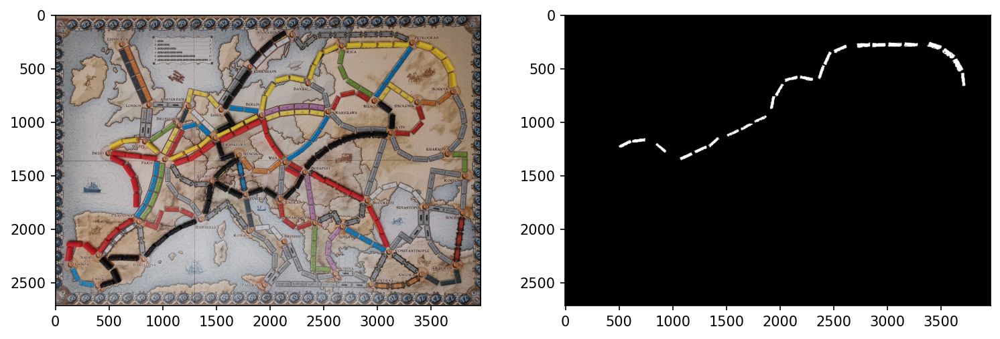

In [24]:
# YELLOW - DEFINED !

mask = (B_black_red_yellow > 185) & (B_black_red_yellow < 200) 
img2 = img_orig_black_red_yellow.copy()

mask = remove_small_objects(mask, min_size = 400)

mask_int = mask.astype(np.uint8)
kernel = np.ones((7,7))
mask_int = cv2.morphologyEx(mask_int, cv2.MORPH_CLOSE, kernel)
kernel = np.ones((5,5))
mask_int = cv2.morphologyEx(mask_int, cv2.MORPH_OPEN, kernel)

plt.figure(dpi=150, figsize=(12, 6))
plt.subplot(1,2,1)   
plt.imshow(img2)
plt.subplot(1,2,2)     
plt.imshow(mask, cmap='gray')

Number of countours here:  25


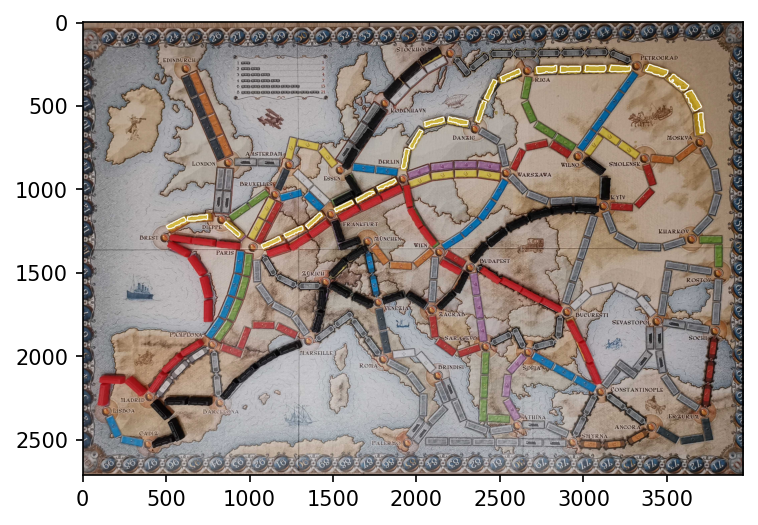

In [25]:
contours, hierarchy = cv2.findContours(mask_int, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

img_cnt = img_orig_black_red_yellow.copy()
cv2.drawContours(img_cnt, contours, -1, (255,255,255), 5)
plt.figure(dpi=150)
plt.imshow(img_cnt)

print("Number of countours here: ", str(len(contours)))

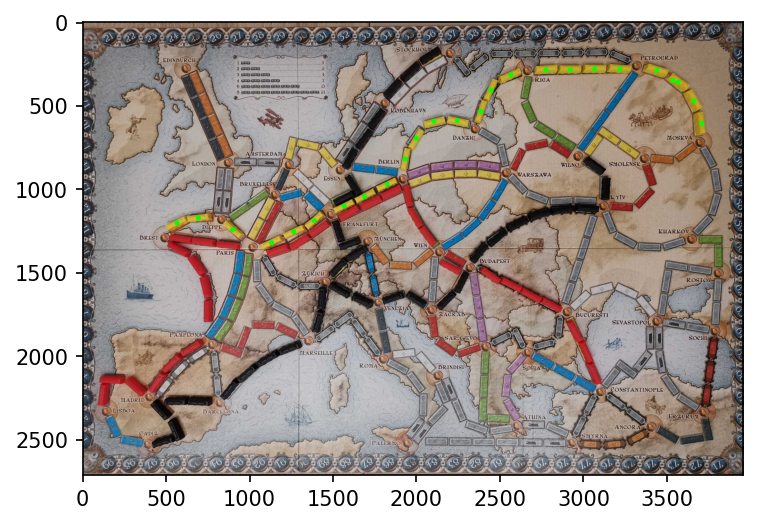

In [26]:
# centers of mass

img_mass = img_orig_black_red_yellow.copy()

train_mass = np.zeros([len(contours), 2])

for i in range(len(contours)):
  
  kpCnt = len(contours[i])
  x = 0
  y = 0

  for kp in contours[i]:
    x = x+kp[0][0]
    y = y+kp[0][1]

  train_mass[i][0] = np.uint32(np.ceil(x/kpCnt))
  train_mass[i][1] = np.uint32(np.ceil(y/kpCnt))

  cv2.circle(img_mass, (np.uint32(np.ceil(x/kpCnt)), np.uint32(np.ceil(y/kpCnt))), 5, (0, 255, 0), 20)

plt.figure(dpi = 150)
plt.imshow(img_mass)

In [27]:
# Adjacency matrix creation with SciPy

distance = cdist(train_mass, train_mass, metric='euclidean')

# substitute high value (10 000) instead of zeros in matrix 'distance'
distance_modified = np.copy(distance)
distance_modified[distance == 0] = 10000.0

# finding minimums and threshold
mins_dist = np.min(distance_modified, axis=1)
threshold_dist = 1.25 * np.mean(mins_dist)

# getting adj matrix (final version with zeros)
distances_adj = np.copy(distance_modified)
distances_adj[distance_modified >= threshold_dist] = 0

# trial version with 1 instead of distances
distances_adj_ones = np.copy(distances_adj)
distances_adj_ones[distances_adj != 0] = 1

# filtering
for i in range(distance_modified.shape[1]):
  #print(i)

  if i == 0:
    distances_adj = np.copy(distance_modified)
    distances_adj[distance_modified >= threshold_dist] = 0

    distances_adj_ones = np.copy(distances_adj)
    distances_adj_ones[distances_adj != 0] = 1

  while np.sum(distances_adj_ones, axis = 1)[i] > 2:
    temp_column_max = np.max(distances_adj[:,i])
    
    #print("max is ", temp_column_max)
    
    distance_modified[distance_modified == temp_column_max] = 0

    distances_adj = np.copy(distance_modified)
    distances_adj[distance_modified >= threshold_dist] = 0

    distances_adj_ones = np.copy(distances_adj)
    distances_adj_ones[distances_adj != 0] = 1

#np.sum(distances_adj_ones, axis = 1)

G=nx.Graph(distances_adj_ones)
graph_chains = sorted(nx.connected_components(G), key = len, reverse=True)

score = 0

for chain in graph_chains:
  print(chain)
  print("chain length = ", len(chain))

  # score calculation

  if len(chain) == 1:
    score += 1
  elif len(chain) == 2:
    score += 2
  elif len(chain) == 3:
    score += 4
  elif len(chain) == 4:
    score += 7
  elif len(chain) == 5: # calculate like 2 and 3 trains
    score += 2
    score += 3
  elif len(chain) == 6:
    score += 15
  elif len(chain) == 7: # calculate like 4 and 3 trains
    score += 7
    score += 3
  elif len(chain) == 8:
    score += 21
  elif len(chain) == 9: #calculate like 1 and 8 trains
    score += 21
    score += 1
  elif len(chain) == 10: #calculate like 4 and 6 trains
    score += 7
    score += 15
  elif len(chain) == 11: #calculate like 4, 4 and 3 trains
    score += 7
    score += 7
    score += 4
  elif len(chain) == 12: #calculate like 6, 3 and 3 trains
    score += 15
    score += 4
    score += 4
  
  print("Your score becomes ", score)

print("Final score for this color is ", score)


{9, 10, 11, 12, 14, 16, 19}
chain length =  7
Your score becomes  10
{13, 15, 17, 18, 24}
chain length =  5
Your score becomes  15
{20, 21, 22, 23}
chain length =  4
Your score becomes  22
{0, 1, 5}
chain length =  3
Your score becomes  26
{8, 6, 7}
chain length =  3
Your score becomes  30
{3, 4}
chain length =  2
Your score becomes  32
{2}
chain length =  1
Your score becomes  33
Final score for this color is  33


## City center search - DONE

In [28]:
from skimage.feature import match_template

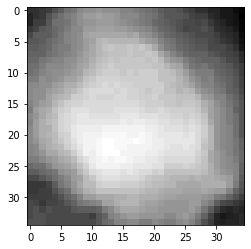

In [32]:
template = B_red_green_blue[780:815,900:935]  # more backgound = better; why? = interesting question to think about
plt.imshow(template, cmap = 'gray')

In [33]:
def convolve(image, kernel, normed=False):
    assert image.ndim == kernel.ndim == 2
    
    # kernel = np.flip(kernel, axis=range(kernel.ndim))  # <- we do not need flipping in cross-corelation
    shape = np.array(image.shape) - kernel.shape + 1
    result = np.empty(shape, dtype=float)
    h, w = kernel.shape
    
    if normed:
        kernel_normed = kernel - np.mean(kernel)
        k_norm = np.sum(kernel_normed ** 2)
        
    for i, j in np.ndindex(*shape):
        if normed:
            patch = image[i:i + h, j:j + w]
            patch_normed = patch - np.mean(patch)
            result[i, j] = np.sum(patch_normed * kernel_normed) / np.sqrt(np.sum(patch_normed ** 2) * k_norm)
        else:
            result[i, j] = (image[i:i + h, j:j + w] * kernel).sum()
            
    return result

def convolve_same(image, kernel, normed=False):
    # pad image before convolution to obtain same resulting shape
    delta = np.array(kernel.shape) - 1
    # left and right padding
    left = delta // 2
    right = delta - left
    padding = np.array([left, right]).T

    image = np.pad(image, padding, mode='constant') 
    return convolve(image, kernel, normed=normed)

In [35]:
corr_conv = convolve_same(B_red_green_blue, template, normed=True)
corr_skimage = match_template(B_red_green_blue, template, pad_input=True)

In [39]:
from skimage.measure import label

# maximum -> center of mass
def get_local_centers(corr, th):
    lbl, n = label(corr >= th, connectivity=2, return_num=True)
    return np.int16([np.round(np.mean(np.argwhere(lbl == i), axis=0)) for i in range(1, n + 1)])


def plot_rectangles(img, points, bbox_shape):
    points = np.int16(points)[::, ::-1]
    res_img = np.int16(img.copy())
    for pt in points:
        cv2.rectangle(res_img, (pt[0] - bbox_shape[0] // 2, pt[1] - bbox_shape[1] // 2),
                      (pt[0] + bbox_shape[0] // 2, pt[1] + bbox_shape[1] // 2), (255, 0, 0), 20)
    return res_img

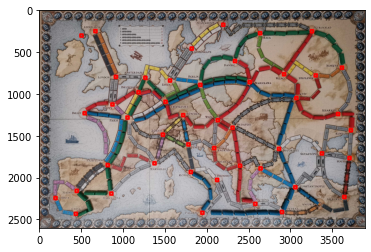

In [42]:
points = get_local_centers(corr_conv, 0.83)
res = plot_rectangles(img_orig_red_green_blue, points, template.shape)

plt.imshow(res, cmap=None)

In [43]:
# centers of cities
points

array([[ 176, 2198],
       [ 252,  673],
       [ 253, 3256],
       [ 276, 2637],
       [ 305,  507],
       [ 460, 1822],
       [ 609, 2338],
       [ 688, 3614],
       [ 766, 2924],
       [ 780, 3301],
       [ 797,  917],
       [ 809, 1269],
       [ 841, 1563],
       [ 859, 2515],
       [ 893, 1924],
       [ 981, 1187],
       [1050, 3070],
       [1095, 1510],
       [1126,  876],
       [1231,  545],
       [1241, 3568],
       [1254, 1720],
       [1283, 1056],
       [1314, 2133],
       [1404, 2309],
       [1434, 3721],
       [1487, 1478],
       [1603, 1782],
       [1647, 2090],
       [1656, 2863],
       [1710, 3375],
       [1766, 3704],
       [1828, 1378],
       [1850,  820],
       [1858, 2398],
       [1889, 2643],
       [1932, 1811],
       [2026, 2125],
       [2114, 3058],
       [2157,  450],
       [2189,  863],
       [2230, 3643],
       [2243,  197],
       [2312, 2580],
       [2409, 2898],
       [2418, 1949],
       [2431,  440]], dtype=int16)

In [44]:
len(points)

47

## Calculating amount of train chains and number of trains in each chain - DONE

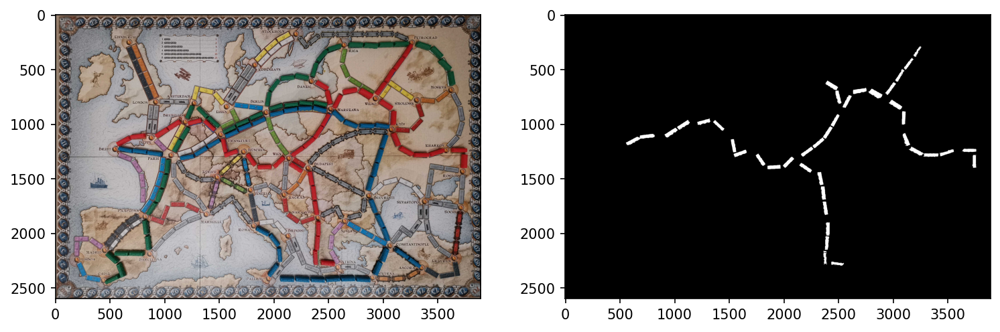

In [48]:
# RED - DEFINED !

mask = (Cr_red_green_blue > 190) & (Cr_red_green_blue < 208)
img2 = img_orig_red_green_blue.copy()
# img2[mask] = 0

mask = remove_small_objects(mask, min_size = 700)

mask_int = mask.astype(np.uint8)
kernel = np.ones((5,5))
mask_int = cv2.morphologyEx(mask_int, cv2.MORPH_CLOSE, kernel)
kernel = np.ones((5,5))
mask_int = cv2.morphologyEx(mask_int, cv2.MORPH_OPEN, kernel)

plt.figure(dpi=150, figsize=(12, 6))
plt.subplot(1,2,1)   
plt.imshow(img2)
plt.subplot(1,2,2)     
plt.imshow(mask, cmap='gray')

Number of countours here:  39


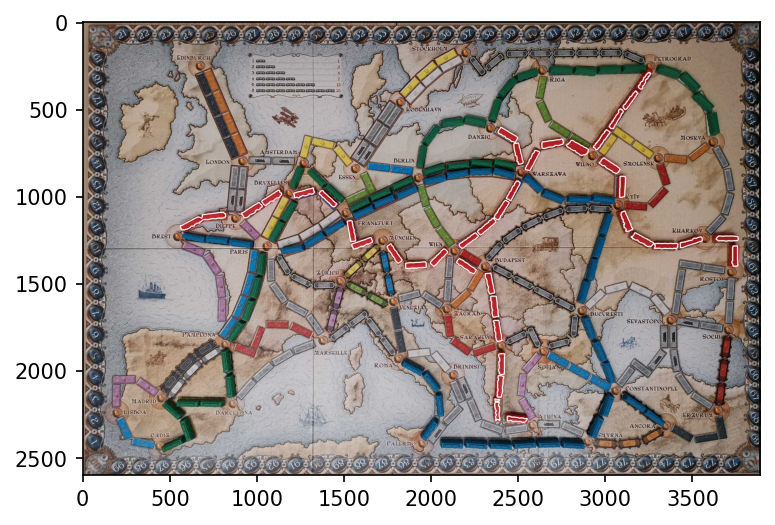

In [50]:
contours, hierarchy = cv2.findContours(mask_int, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

img_cnt = img_orig_red_green_blue.copy()
cv2.drawContours(img_cnt, contours, -1, (255,255,255), 5)
plt.figure(dpi=150)
plt.imshow(img_cnt)

print("Number of countours here: ", str(len(contours)))

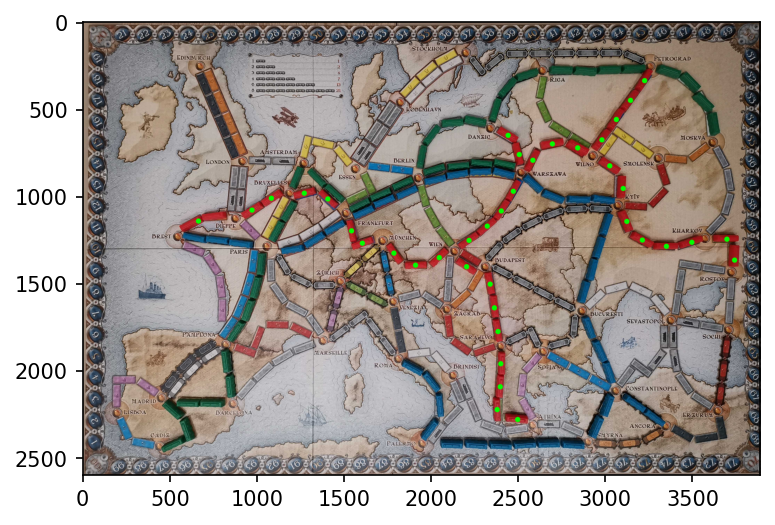

In [52]:
# centers of mass

img_mass = img_orig_red_green_blue.copy()

train_mass = np.zeros([len(contours), 2])

for i in range(len(contours)):
  
  kpCnt = len(contours[i])
  x = 0
  y = 0

  for kp in contours[i]:
    x = x+kp[0][0]
    y = y+kp[0][1]

  train_mass[i][0] = np.uint32(np.ceil(x/kpCnt))
  train_mass[i][1] = np.uint32(np.ceil(y/kpCnt))

  cv2.circle(img_mass, (np.uint32(np.ceil(x/kpCnt)), np.uint32(np.ceil(y/kpCnt))), 5, (0, 255, 0), 20)

plt.figure(dpi = 150)
plt.imshow(img_mass)

In [53]:
# Adjacency matrix creation with SciPy

distance = cdist(train_mass, train_mass, metric='euclidean')
distance

array([[   0.        ,  131.04579352,  212.94130647, ..., 1812.63344336,
        1942.8929461 , 2076.77851491],
       [ 131.04579352,    0.        ,  132.23085873, ..., 1800.02249986,
        1932.83470581, 2068.87892348],
       [ 212.94130647,  132.23085873,    0.        , ..., 1672.33728655,
        1805.75330541, 1942.32669755],
       ...,
       [1812.63344336, 1800.02249986, 1672.33728655, ...,    0.        ,
         136.60527076,  275.63200104],
       [1942.8929461 , 1932.83470581, 1805.75330541, ...,  136.60527076,
           0.        ,  139.03237033],
       [2076.77851491, 2068.87892348, 1942.32669755, ...,  275.63200104,
         139.03237033,    0.        ]])

In [54]:
# substitute high value (10 000) instead of zeros in matrix 'distance'
distance_modified = np.copy(distance)
distance_modified[distance == 0] = 10000.0

# finding minimums and threshold
mins_dist = np.min(distance_modified, axis=1)
threshold_dist = 1.25 * np.mean(mins_dist)
threshold_dist

170.89514704505808

In [55]:
# getting adj matrix (final version with zeros)
distances_adj = np.copy(distance_modified)
distances_adj[distance_modified >= threshold_dist] = 0
distances_adj

array([[  0.        , 131.04579352,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       [131.04579352,   0.        , 132.23085873, ...,   0.        ,
          0.        ,   0.        ],
       [  0.        , 132.23085873,   0.        , ...,   0.        ,
          0.        ,   0.        ],
       ...,
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
        136.60527076,   0.        ],
       [  0.        ,   0.        ,   0.        , ..., 136.60527076,
          0.        , 139.03237033],
       [  0.        ,   0.        ,   0.        , ...,   0.        ,
        139.03237033,   0.        ]])

In [56]:
# trial version with 1 instead of distances
distances_adj_ones = np.copy(distances_adj)
distances_adj_ones[distances_adj != 0] = 1
distances_adj_ones

array([[0., 1., 0., ..., 0., 0., 0.],
       [1., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.]])

In [57]:
np.sum(distances_adj_ones, axis = 1)

array([1., 2., 2., 1., 1., 2., 2., 2., 3., 2., 1., 1., 2., 1., 1., 1., 2.,
       2., 1., 2., 0., 1., 1., 2., 1., 1., 1., 1., 1., 2., 2., 2., 2., 2.,
       3., 1., 2., 2., 1.])

In [58]:
#np.max(distance_modified[9])
distance_modified

array([[10000.        ,   131.04579352,   212.94130647, ...,
         1812.63344336,  1942.8929461 ,  2076.77851491],
       [  131.04579352, 10000.        ,   132.23085873, ...,
         1800.02249986,  1932.83470581,  2068.87892348],
       [  212.94130647,   132.23085873, 10000.        , ...,
         1672.33728655,  1805.75330541,  1942.32669755],
       ...,
       [ 1812.63344336,  1800.02249986,  1672.33728655, ...,
        10000.        ,   136.60527076,   275.63200104],
       [ 1942.8929461 ,  1932.83470581,  1805.75330541, ...,
          136.60527076, 10000.        ,   139.03237033],
       [ 2076.77851491,  2068.87892348,  1942.32669755, ...,
          275.63200104,   139.03237033, 10000.        ]])

In [59]:
for i in range(distance_modified.shape[1]):
  print(i)

  if i == 0:
    distances_adj = np.copy(distance_modified)
    distances_adj[distance_modified >= threshold_dist] = 0

    distances_adj_ones = np.copy(distances_adj)
    distances_adj_ones[distances_adj != 0] = 1

  while np.sum(distances_adj_ones, axis = 1)[i] > 2:
    temp_column_max = np.max(distances_adj[:,i])
    
    print("max is ", temp_column_max)
    
    distance_modified[distance_modified == temp_column_max] = 0

    distances_adj = np.copy(distance_modified)
    distances_adj[distance_modified >= threshold_dist] = 0

    distances_adj_ones = np.copy(distances_adj)
    distances_adj_ones[distances_adj != 0] = 1



np.sum(distances_adj_ones, axis = 1)

0
1
2
3
4
5
6
7
8
max is  168.00297616411441
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
max is  155.64703659241314
35
36
37
38


array([1., 2., 2., 1., 1., 2., 1., 2., 2., 2., 1., 1., 2., 1., 1., 1., 2.,
       2., 1., 2., 0., 1., 1., 2., 1., 1., 1., 1., 1., 1., 2., 2., 2., 2.,
       2., 1., 2., 2., 1.])

In [64]:
# calculations through graphs
G=nx.Graph(distances_adj_ones)

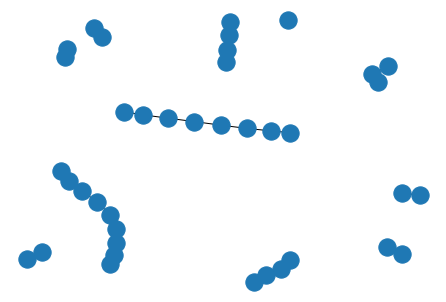

In [69]:
nx.draw(G)

In [66]:
graph_chains = sorted(nx.connected_components(G), key = len, reverse=True)
graph_chains

[{30, 31, 32, 33, 34, 35, 36, 37, 38},
 {7, 8, 9, 11, 17, 19, 23, 27},
 {0, 1, 2, 3},
 {12, 14, 16, 21},
 {4, 5, 6},
 {10, 15},
 {13, 18},
 {22, 25},
 {24, 26},
 {28, 29},
 {20}]

In [70]:
score = 0

for chain in graph_chains:
  print(chain)
  print("chain length = ", len(chain))

  # score calculation

  if len(chain) == 1:
    score += 1
  elif len(chain) == 2:
    score += 2
  elif len(chain) == 3:
    score += 4
  elif len(chain) == 4:
    score += 7
  elif len(chain) == 6:
    score += 15
  elif len(chain) == 8:
    score += 21
  
  print("Your score becomes ", score)

print("Final score for this color is ", score)


{32, 33, 34, 35, 36, 37, 38, 30, 31}
chain length =  9
Your score becomes  0
{7, 8, 9, 11, 17, 19, 23, 27}
chain length =  8
Your score becomes  21
{0, 1, 2, 3}
chain length =  4
Your score becomes  28
{16, 12, 21, 14}
chain length =  4
Your score becomes  35
{4, 5, 6}
chain length =  3
Your score becomes  39
{10, 15}
chain length =  2
Your score becomes  41
{18, 13}
chain length =  2
Your score becomes  43
{25, 22}
chain length =  2
Your score becomes  45
{24, 26}
chain length =  2
Your score becomes  47
{28, 29}
chain length =  2
Your score becomes  49
{20}
chain length =  1
Your score becomes  50
Final score for this color is  50
